In [1]:
from dlcliche.notebook import *
from dlcliche.image import *
from dlcliche.math import *

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, models

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

deterministic_everything(123)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [2]:
import skimage.draw # line, polygon, circle, ellipse

class PremitiveObject:
    def fill_mask(self, x, y, w, h,  shape):
        raise NotImplementedError()

    def edge_mask(self, x, y, w, h,  shape):
        raise NotImplementedError()


class EggLikeObject(PremitiveObject):
    def fill_mask(self, x, y, w, h,  shape):
        return skimage.draw.ellipse(x, y, w, h, shape=shape)

    def edge_mask(self, x, y, w, h,  shape):
        return skimage.draw.ellipse_perimeter(x, y, w, h,  shape=shape)


class TriangleObject(PremitiveObject):
    def _points(self, x, y, w, h,  shape):
        w, h = 2 * w, 2 * h
        pts = [[x, y - h//2], [x - w//2, y + h], [x + w//2, y + h]]
        return [p[0] for p in pts], [p[1] for p in pts]

    def fill_mask(self, x, y, w, h,  shape):
        return skimage.draw.polygon(*self._points(x, y, w, h, shape),  shape=shape)

    def edge_mask(self, x, y, w, h,  shape):
        return skimage.draw.polygon_perimeter(*self._points(x, y, w, h, shape),  shape=shape)


class BottleObject(PremitiveObject):
    def _points(self, x, y, w, h,  shape):
        w, h = 2 * w, 2 * h
        pts = [[x - int(0.1*w), y - int(0.5*h)], [x + int(0.1*w), y - int(0.5*h)], 
               [x + int(0.1*w), y - int(0.2*h)], [x + int(0.5*w), y - int(0.1*h)],
               [x + int(0.5*w), y + int(0.5*h)], [x - int(0.5*w), y + int(0.5*h)],
               [x - int(0.5*w), y - int(0.1*h)], [x - int(0.1*w), y - int(0.2*h)],
              [x - int(0.1*w), y - int(0.5*h)]]
        return [p[0] for p in pts], [p[1] for p in pts]

    def fill_mask(self, x, y, w, h,  shape):
        return skimage.draw.polygon(*self._points(x, y, w, h, shape),  shape=shape)

    def edge_mask(self, x, y, w, h,  shape):
        return skimage.draw.polygon_perimeter(*self._points(x, y, w, h, shape),  shape=shape)


class MoShapesDataset(Dataset):
    """TBD dataset."""

    def __init__(self, N, n_class=3, size=(384, 224), immutable=False, transform=None):
        self.N = N
        self.n_class = n_class
        self.width, self.height = size
        self.obj_width = size[0] // 8 # TBD
        self.obj_height = size[1] // 3 # TBD
        self.history= {}
        self.range_x, self.range_y, self.range_z = (0.1, 0.9), (0.4, 0.9), (0.7, 1.)
        self.immutable = immutable
        self.transform = transform

        self.transform_coords = torch.from_numpy
        self.objects = [
            EggLikeObject(),
            TriangleObject(),
            BottleObject(),
        ]

    def __len__(self):
        return self.N

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        coords, colors, bg = self._params(idx, self.immutable)
        x, y = self.draw_image(coords, colors, bg), coords

        if self.transform:
            x = self.transform(x).float()
        if self.transform_coords:
            y = self.transform_coords(y).float()

        return x, y
    
    def random_color(self):
        return np.array([random.randint(0, 255) for _ in range(3)])

    def random_colors(self):
        return np.array([self.random_color() for _ in range(self.n_class)])

    def random_coord(self):
        return np.array([random.uniform(*self.range_x),
                                     random.uniform(*self.range_y),
                                     random.uniform(*self.range_z)])

    def random_coords(self):
        return np.array([self.random_coord() for _ in range(self.n_class)])

    def _params(self, idx, immutable):
        if immutable and idx in self.history:
            coords, colors, bg = self.history[idx]
        else:
            coords, colors = self.random_coords(), self.random_colors()
            bg = self.random_color()
            self.history[idx] = (coords, colors, bg)
        return (coords, colors, bg)

    def _calc_draw_param(self, coord):
        cx, cy = self.width * coord[0], self.height * coord[1]
        w, h = self.obj_width * coord[2], self.obj_height * coord[2]
        x, y = cx - w//2, cy - h//2
        return x, y, w, h

    def filled_shape(self, coord, c):
        x, y, w, h = self._calc_draw_param(coord)
        return self.objects[c].fill_mask(x, y, w, h,  shape=(self.width, self.height))

    def draw_image(self, coords, colors, bg, as_mask=False):
        # sort coords by its z-coord
        shapes = [(c, coord, color) for c, (coord, color) in enumerate(zip(coords, colors))]
        shapes.sort(key=lambda s: s[1][2])

        # mask
        mask = np.zeros([self.height, self.width], dtype=np.uint8)
        for c, coord, _ in shapes:
            cc, rr = self.filled_shape(coord, c)
            mask[rr, cc] = c + 1 # class number
        if as_mask:
            return mask
        
        # image := mask replaced class number with colors 
        bg_color = bg # np.array(bg).reshape([1, 1, 3])
        image = np.zeros([self.height, self.width, 3], dtype=np.uint8)
        image[mask == 0] = bg_color
        for c, _, color in shapes:
            image[mask == c + 1] = color
        return image
    
    def line_shape(self, coord, c, increment=0):
        x, y, w, h = self._calc_draw_param(coord)
        x, y, w, h = list(map(int, [x, y, w+increment, h+increment]))
        return self.objects[c].edge_mask(x, y, w, h, shape=(self.width, self.height))
    
    def draw_preds(self, image, coords):
        line_color = np.array([1., 0., 0.]) #if image is float else np.array([255, 0, 0])
        for c, coord in enumerate(coords):
            for i in range(5):
                cc, rr = self.line_shape(coord, c, increment=i)
                image[rr, cc, :] = line_color

0 (224, 384, 3) tensor([[0.1419, 0.4436, 0.8222],
        [0.1862, 0.8506, 0.7114],
        [0.5290, 0.5661, 0.9556]])
1 (224, 384, 3) tensor([[0.3524, 0.6242, 0.9716],
        [0.1742, 0.4711, 0.9370],
        [0.1170, 0.8556, 0.8720]])
2 (224, 384, 3) tensor([[0.5165, 0.6097, 0.8530],
        [0.7779, 0.7227, 0.9177],
        [0.1661, 0.6435, 0.7786]])
3 (224, 384, 3) tensor([[0.8169, 0.8988, 0.8217],
        [0.5008, 0.8120, 0.7179],
        [0.3302, 0.6474, 0.9293]])
4 (224, 384, 3) tensor([[0.1168, 0.7994, 0.9055],
        [0.8637, 0.7171, 0.7001],
        [0.5941, 0.6552, 0.9121]])
5 (224, 384, 3) tensor([[0.4313, 0.4119, 0.8908],
        [0.2311, 0.8816, 0.7193],
        [0.7958, 0.4720, 0.9006]])


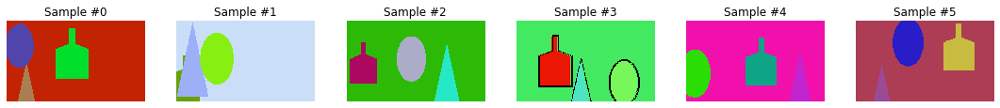

In [3]:
mo_ds = MoShapesDataset(100)
fig = plt.figure(figsize=(15, 8))

for i in range(len(mo_ds)):
    x, y = mo_ds[i]

    print(i, x.shape, y)

    if i == 3:
        mo_ds.draw_preds(x, (mo_ds.history[i][0]+np.array([0.01, 0.001, -0.002])))
    
    ax = plt.subplot(1, 6, i + 1)
    plt.tight_layout()
    ax.set_title('Sample #{}'.format(i))
    ax.axis('off')
    plt.imshow(x)

    if i == 5:
        plt.show()
        break

In [4]:
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        image, landmarks = sample['image'], sample['coords']

        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'coords': torch.from_numpy(landmarks)}

In [5]:
N_TRAIN = 5000
N_VALID = 500
N = N_TRAIN + N_VALID
N_CLASSES = 3

transformed_dataset = MoShapesDataset(N=N, n_class=N_CLASSES, transform=transforms.ToTensor())

for i in range(len(transformed_dataset)):
    x, y = transformed_dataset[i]
    print(i, x.size(), y.size())

    if i == 3:
        break

0 torch.Size([3, 224, 384]) torch.Size([3, 3])
1 torch.Size([3, 224, 384]) torch.Size([3, 3])
2 torch.Size([3, 224, 384]) torch.Size([3, 3])
3 torch.Size([3, 224, 384]) torch.Size([3, 3])


In [6]:
def show_batch(sample_batched, preds=None, ds=None):
    """Show image with landmarks for a batch of samples."""
    images_batch, coords_batch = \
            sample_batched[0], sample_batched[1]
    batch_size = len(images_batch)
    im_size = images_batch.size(2)
    grid_border_size = 2

    images_batch = [x.numpy().transpose((1, 2, 0)) for x in images_batch]
    if preds is not None:
        preds = [x.numpy() for x in preds]
        for img, pred in zip(images_batch, preds):
            ds.draw_preds(img, pred)

    images_batch = [transforms.ToTensor()(x) for x in images_batch]
    
    grid = utils.make_grid(images_batch)
    plt.imshow(grid.numpy().transpose((1, 2, 0)))

    for i in range(batch_size):
        plt.title(str(coords_batch.numpy()))

0 torch.Size([4, 3, 224, 384]) torch.Size([4, 3, 3])
1 torch.Size([4, 3, 224, 384]) torch.Size([4, 3, 3])
2 torch.Size([4, 3, 224, 384]) torch.Size([4, 3, 3])
3 torch.Size([4, 3, 224, 384]) torch.Size([4, 3, 3])


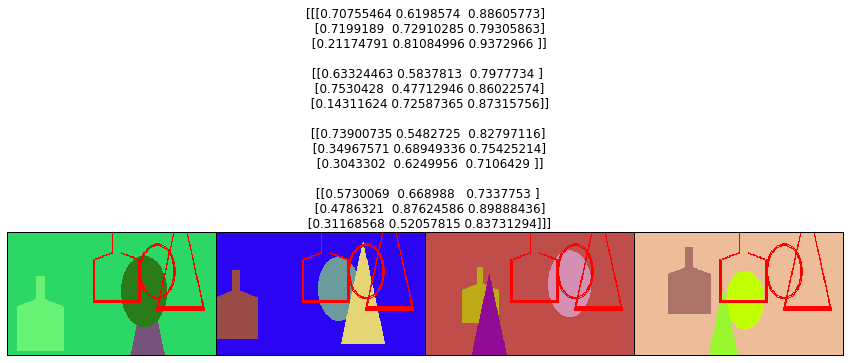

In [7]:
N_TRAIN = 5000
N_VALID = 500
N = N_TRAIN + N_VALID
N_CLASSES = 3
BS = 32
WORKERS = 8

image_datasets = {x: MoShapesDataset(N=n,
                                     n_class=N_CLASSES, 
                                     transform=transforms.ToTensor(),
                                     immutable=immutable)
                  for x, n, immutable in zip(['train', 'val'], [N_TRAIN, N_VALID], [False, True])}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=32,
                                             shuffle=True, num_workers=WORKERS)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Test 
dataloader = DataLoader(image_datasets['val'], batch_size=4,
                        shuffle=True, num_workers=4)

fake_preds = torch.Tensor([
    [[0.7565, 0.4196, 0.6391], [0.8828, 0.1762, 0.8553], [0.5731, 0.4122, 0.8475]],
    [[0.7565, 0.4196, 0.6391], [0.8828, 0.1762, 0.8553], [0.5731, 0.4122, 0.8475]],
    [[0.7565, 0.4196, 0.6391], [0.8828, 0.1762, 0.8553], [0.5731, 0.4122, 0.8475]],
    [[0.7565, 0.4196, 0.6391], [0.8828, 0.1762, 0.8553], [0.5731, 0.4122, 0.8475]],
]).float()

for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, sample_batched[0].size(),
          sample_batched[1].size())

    # observe 4th batch and stop.
    if i_batch == 3:
        plt.figure(figsize=(15, 8))
        show_batch(sample_batched, preds=fake_preds, ds=image_datasets['val'])
        plt.axis('off')
        plt.ioff()
        plt.show()
        break

In [8]:
import time
import copy

def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1e10

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    outputs = outputs.view((-1, N_CLASSES, 3))
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f}')

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print('Best val Loss: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [9]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            outputs = outputs.view((-1, N_CLASSES, 3))
            outputs = outputs.cpu()
            def A(t): return t.cpu()

            fig = plt.figure(figsize=(12, 8))
            show_batch((A(inputs), A(labels)), preds=A(outputs), ds=image_datasets['val'])
            plt.show()
            
            if i >= 9: break

        model.train(mode=was_training)


## Fast.ai head

In [22]:
from coord_conv import CoordConv
import onecyclelr

class AdaptiveConcatPool2d(nn.Module):
    "Layer that concats `AdaptiveAvgPool2d` and `AdaptiveMaxPool2d`."
    def __init__(self, sz=None):
        "Output will be 2*sz or 2 if sz is None"
        super().__init__()
        self.output_size = sz or 1
        self.ap = nn.AdaptiveAvgPool2d(self.output_size)
        self.mp = nn.AdaptiveMaxPool2d(self.output_size)

    def forward(self, x): return torch.cat([self.mp(x), self.ap(x)], 1)


if False:
    model_ft = models.vgg16_bn(pretrained=True)

    coord_conv = CoordConv(3, 64, 3, padding=1)
    model_ft.features = nn.Sequential(coord_conv, *model_ft.features[1:])

    # Newly created modules have require_grad=True by default
    num_features = model_ft.classifier[6].in_features
    features = list(model_ft.classifier.children())[:-1] # Remove last layer
    features.extend([nn.Linear(num_features, 3 * N_CLASSES)]) # Add our layer with 4 outputs
    model_ft.classifier = nn.Sequential(*features) # Replace the model classifier

    model_ft = model_ft.to(device)
else:
    model_ft = models.resnet50(pretrained=True)
    num_filters = model_ft.fc.in_features
    num_fc_hidden = num_filters # // 2
    #model_ft.avgpool = AdaptiveConcatPool2d()
    model_ft.fc = nn.Sequential(
         nn.BatchNorm1d(num_filters),
    #     nn.Dropout(0.1),
    #     nn.Linear(num_filters*2, 512),
    #     nn.ReLU(),
    #     nn.BatchNorm1d(512),
         #nn.Dropout(0.2),
        nn.Linear(num_filters, 3 * N_CLASSES),
    )
    model_ft = model_ft.to(device)

n_epochs = 25
lr = 0.0003

criterion = nn.MSELoss()
optimizer = optim.AdamW(model_ft.parameters(), lr=lr)
scheduler = onecyclelr.OneCycleLR(optimizer, n_epochs, lr_range=(lr/10, lr))
model_ft = train_model(model_ft, criterion, optimizer, scheduler, num_epochs=n_epochs)

Epoch 0/24
train Loss: 0.5179
val Loss: 0.4360

Epoch 1/24
train Loss: 0.3902
val Loss: 0.3214

Epoch 2/24
train Loss: 0.2091
val Loss: 0.0954

Epoch 3/24
train Loss: 0.0336
val Loss: 0.0273

Epoch 4/24
train Loss: 0.0078
val Loss: 0.0060

Epoch 5/24
train Loss: 0.0067
val Loss: 0.0046

Epoch 6/24
train Loss: 0.0068
val Loss: 0.0124

Epoch 7/24
train Loss: 0.0067
val Loss: 0.0067

Epoch 8/24
train Loss: 0.0064
val Loss: 0.0061

Epoch 9/24
train Loss: 0.0065
val Loss: 0.0085

Epoch 10/24
train Loss: 0.0065
val Loss: 0.0112

Epoch 11/24
train Loss: 0.0062
val Loss: 0.0048

Epoch 12/24
train Loss: 0.0054
val Loss: 0.0222

Epoch 13/24
train Loss: 0.0055
val Loss: 0.0058

Epoch 14/24
train Loss: 0.0048
val Loss: 0.0057

Epoch 15/24
train Loss: 0.0045
val Loss: 0.0047

Epoch 16/24
train Loss: 0.0037
val Loss: 0.0016

Epoch 17/24
train Loss: 0.0030
val Loss: 0.0033

Epoch 18/24
train Loss: 0.0031
val Loss: 0.0014

Epoch 19/24
train Loss: 0.0027
val Loss: 0.0014

Epoch 20/24
train Loss: 0.0023

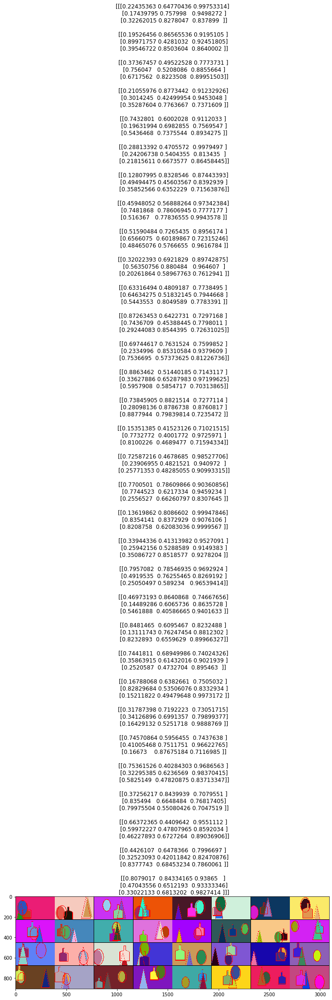

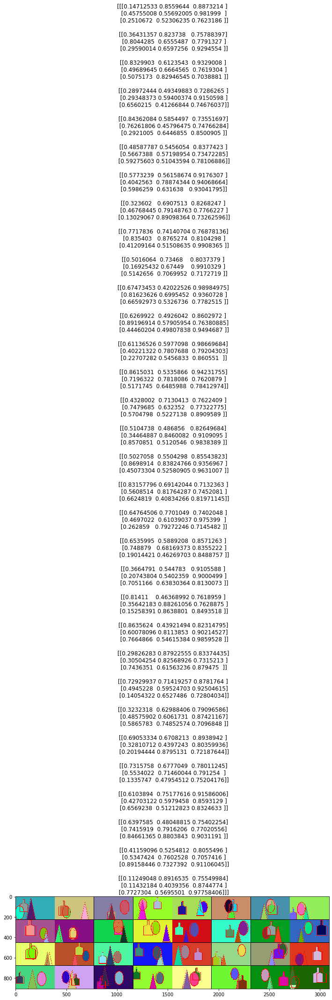

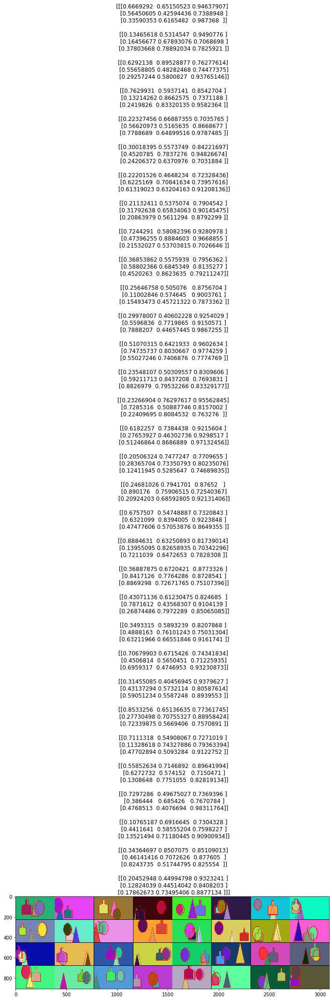

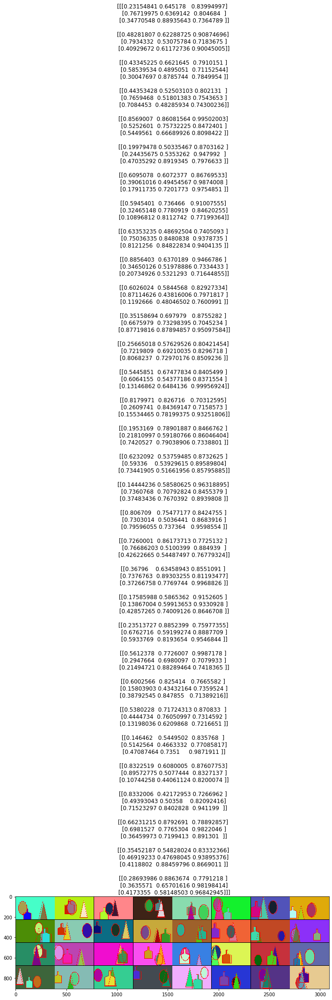

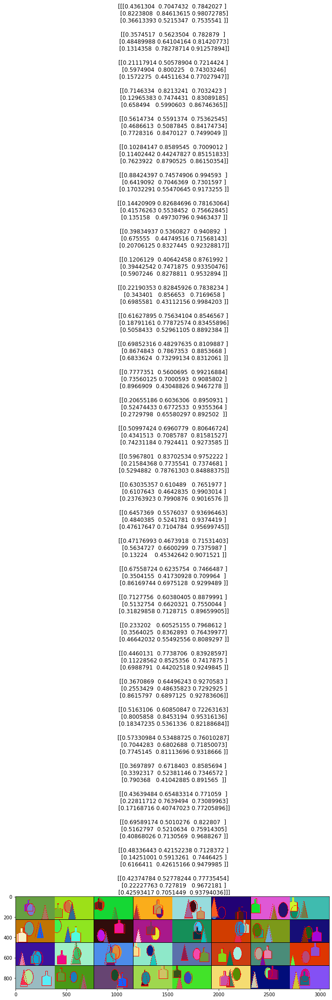

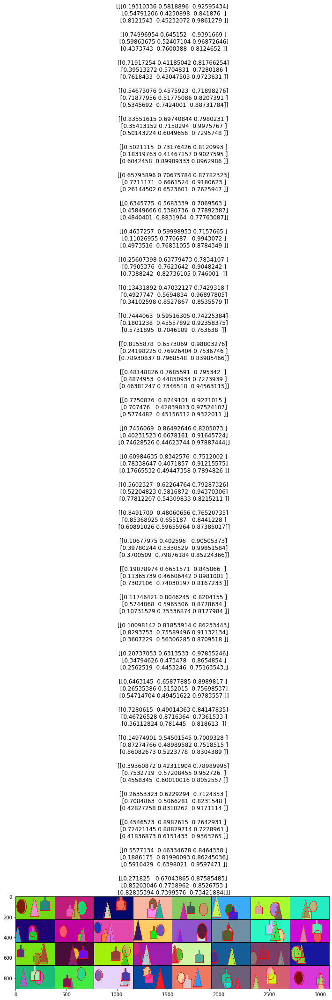

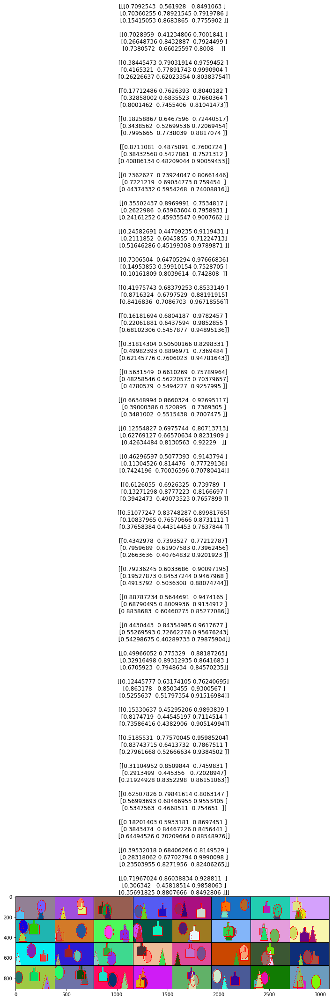

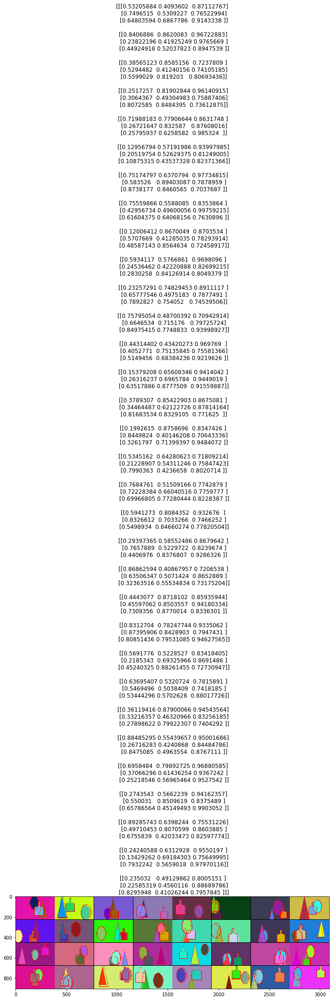

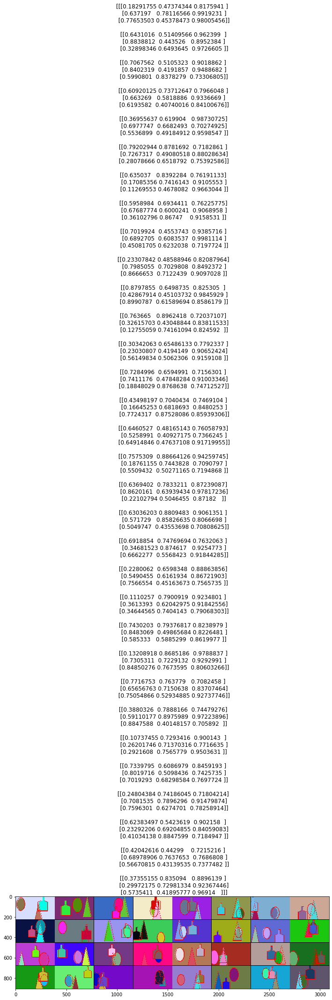

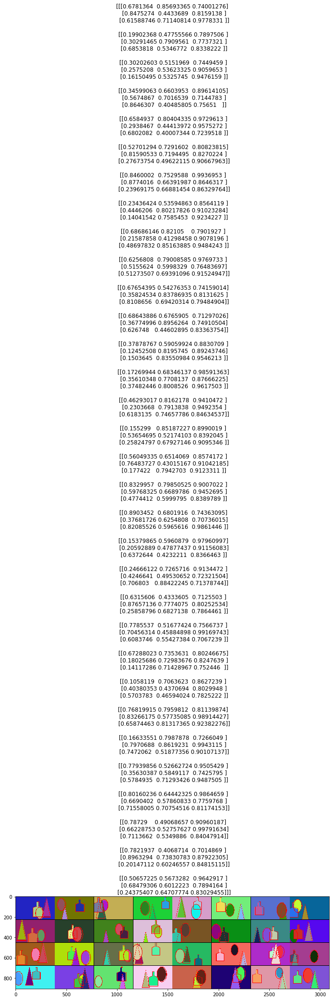

In [23]:
visualize_model(model_ft)

## CoordConv

50 ... 0.0008 but not so good
18 ... 0.0012 worse
VGG16BN ...

Epoch 0/24
train Loss: 0.0407
val Loss: 0.0101

Epoch 1/24
train Loss: 0.0135
val Loss: 0.0051

Epoch 2/24
train Loss: 0.0083
val Loss: 0.0035

Epoch 3/24
train Loss: 0.0062
val Loss: 0.0027

Epoch 4/24
train Loss: 0.0048
val Loss: 0.0019

Epoch 5/24
train Loss: 0.0040
val Loss: 0.0018

Epoch 6/24
train Loss: 0.0036
val Loss: 0.0016

Epoch 7/24
train Loss: 0.0034
val Loss: 0.0015

Epoch 8/24
train Loss: 0.0032
val Loss: 0.0016

Epoch 9/24
train Loss: 0.0029
val Loss: 0.0013

Epoch 10/24
train Loss: 0.0028
val Loss: 0.0014

Epoch 11/24
train Loss: 0.0027
val Loss: 0.0012

Epoch 12/24
train Loss: 0.0024
val Loss: 0.0011

Epoch 13/24
train Loss: 0.0022
val Loss: 0.0012

Epoch 14/24
train Loss: 0.0022
val Loss: 0.0009

Epoch 15/24
train Loss: 0.0020
val Loss: 0.0009

Epoch 16/24
train Loss: 0.0019
val Loss: 0.0009

Epoch 17/24
train Loss: 0.0018
val Loss: 0.0008

Epoch 18/24
train Loss: 0.0017
val Loss: 0.0008

Epoch 19/24
train Loss: 0.0017
val Loss: 0.0007

Epoch 20/24
train Loss: 0.0016

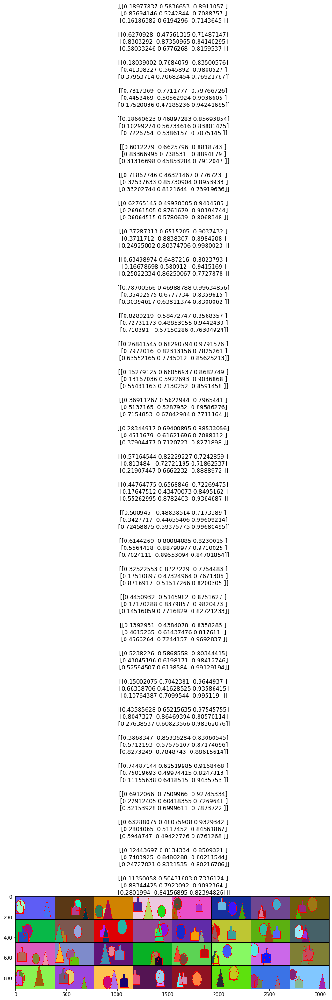

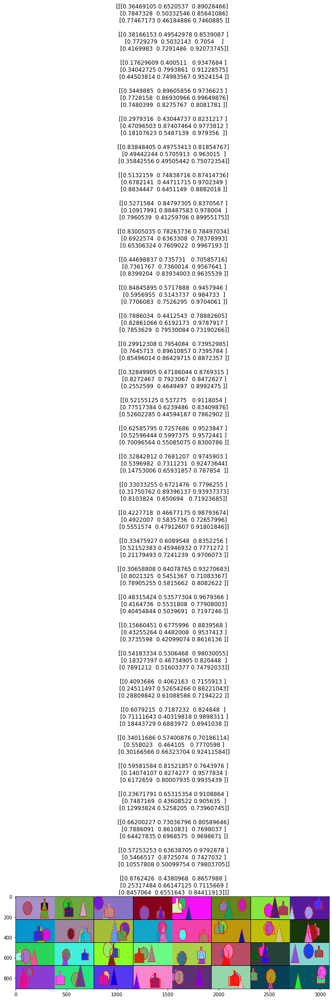

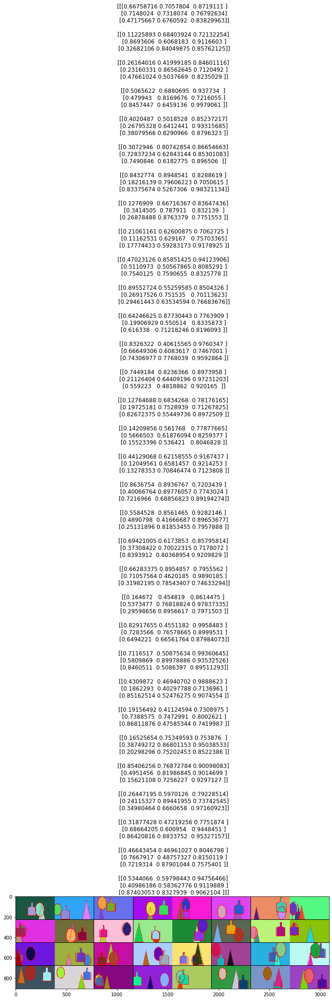

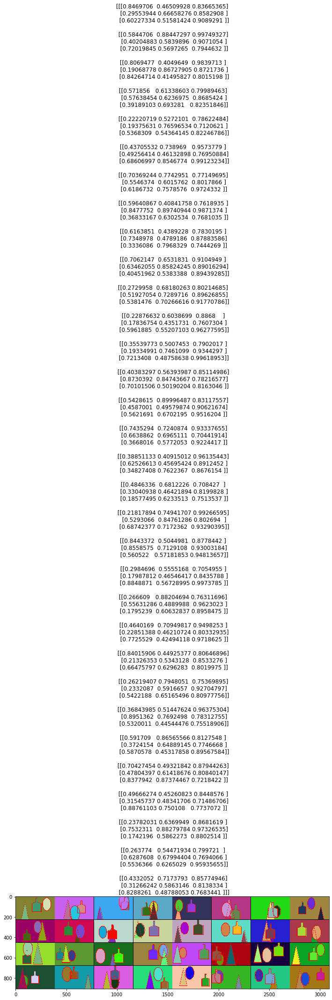

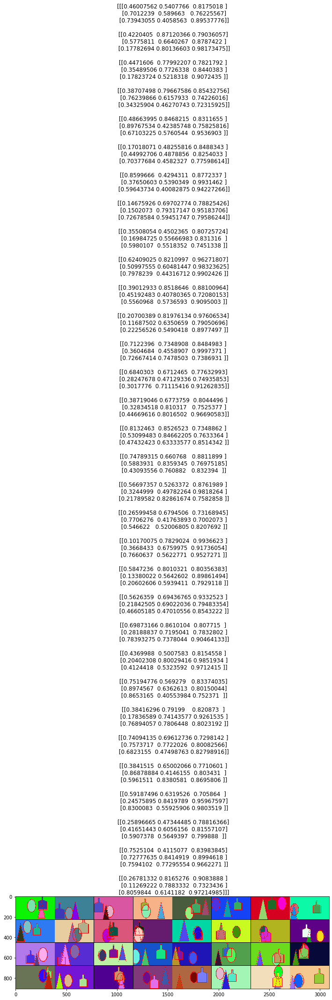

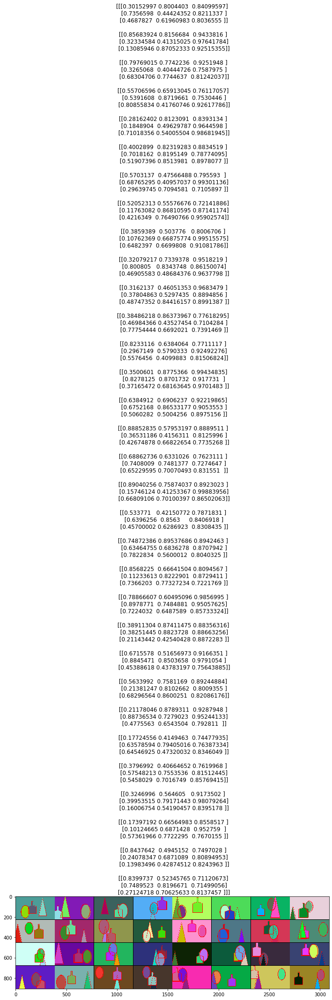

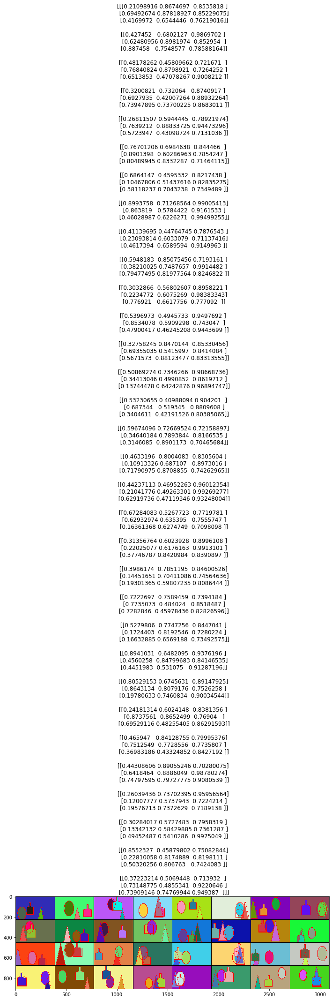

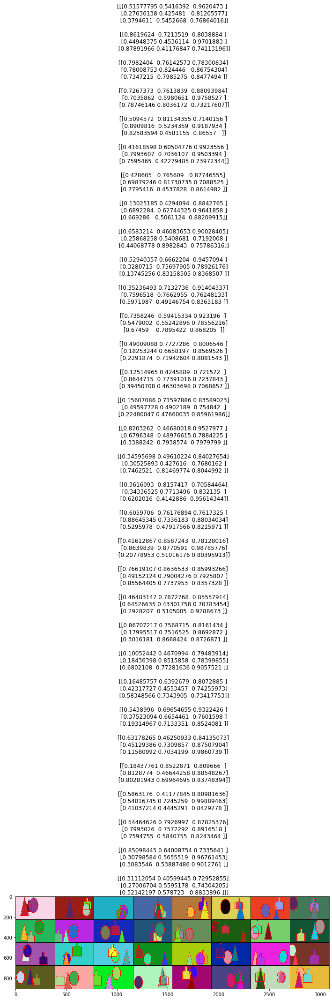

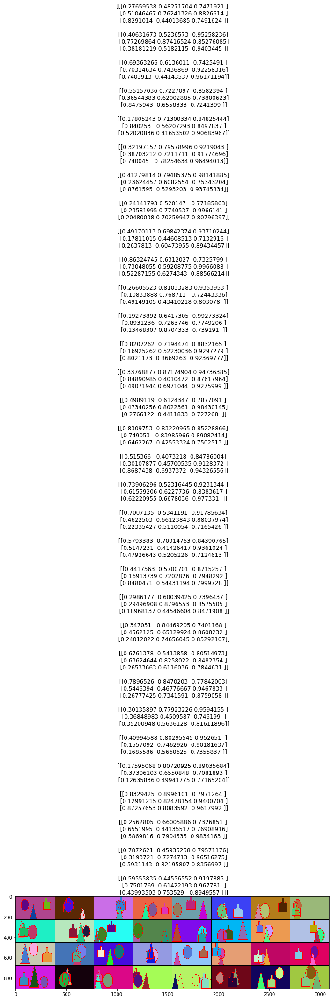

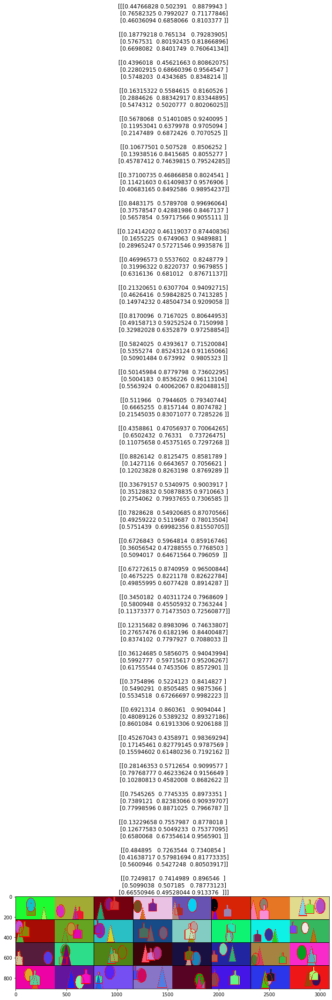

In [10]:
from coord_conv import CoordConv
import onecyclelr
if True:
    model_ft = models.vgg16_bn(pretrained=True)

    coord_conv = CoordConv(3, 64, 3, padding=1)
    model_ft.features = nn.Sequential(coord_conv, *model_ft.features[1:])

    # Newly created modules have require_grad=True by default
    num_features = model_ft.classifier[6].in_features
    features = list(model_ft.classifier.children())[:-1] # Remove last layer
    features.extend([nn.Linear(num_features, 3 * N_CLASSES)]) # Add our layer with 4 outputs
    model_ft.classifier = nn.Sequential(*features) # Replace the model classifier

    model_ft = model_ft.to(device)
else:
    model_ft = models.resnet18(pretrained=True)
    model_ft.conv1 = CoordConv(3, 64, 7, padding=3, stride=2)
    num_filters = model_ft.fc.in_features
    num_fc_hidden = num_filters
    model_ft.fc = nn.Sequential(
         nn.BatchNorm1d(num_filters),
    #     nn.Dropout(0.1),
    #     nn.Linear(num_filters*2, 512),
    #     nn.ReLU(),
    #     nn.BatchNorm1d(512),
         #nn.Dropout(0.2),
        nn.Linear(num_filters, 3 * N_CLASSES),
    )
    model_ft = model_ft.to(device)

n_epochs = 25
lr = 0.0003

criterion = nn.MSELoss()
optimizer = optim.AdamW(model_ft.parameters(), lr=lr)
scheduler = onecyclelr.OneCycleLR(optimizer, n_epochs, lr_range=(lr/10, lr))
model_ft = train_model(model_ft, criterion, optimizer, scheduler, num_epochs=n_epochs)

visualize_model(model_ft)

## Old result

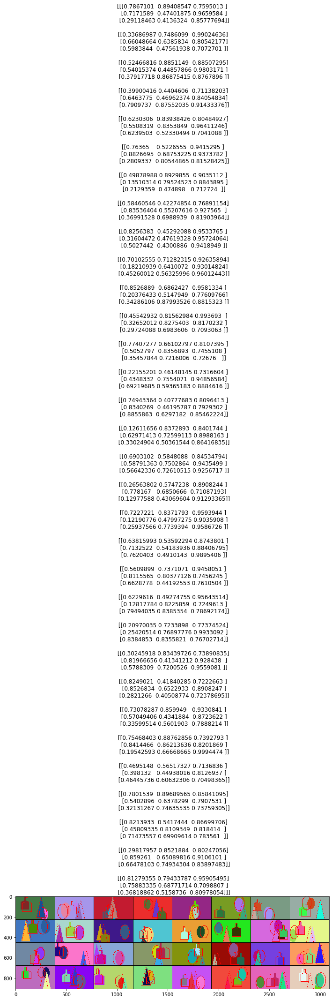

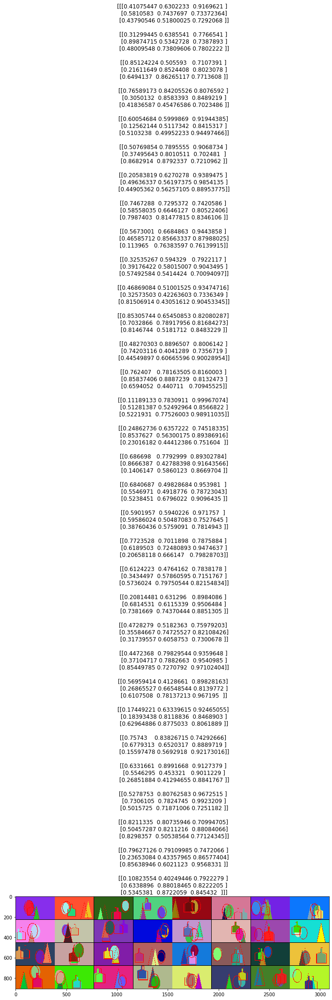

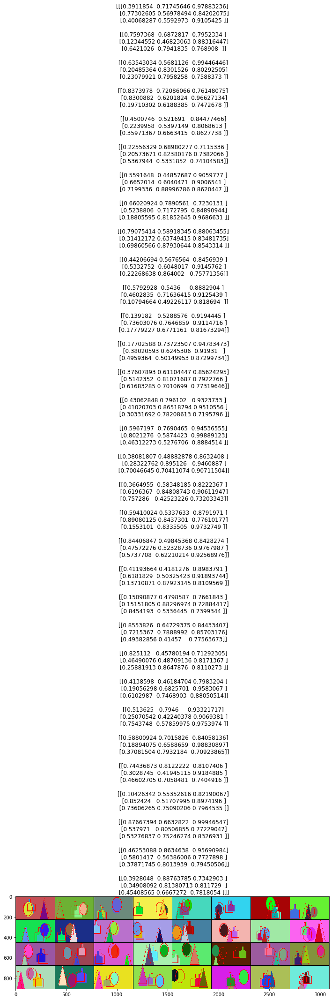

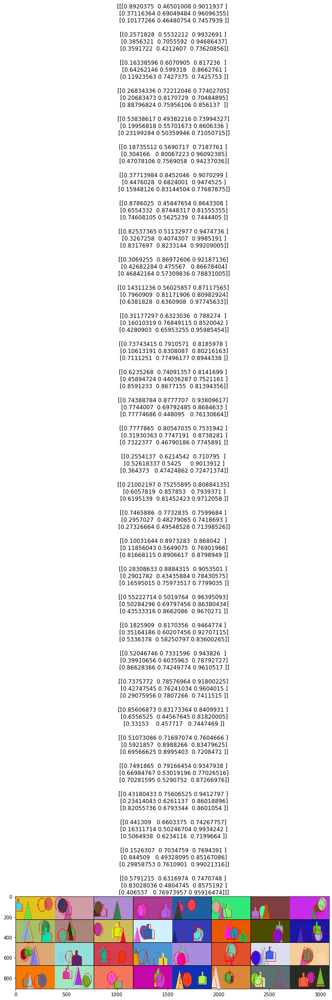

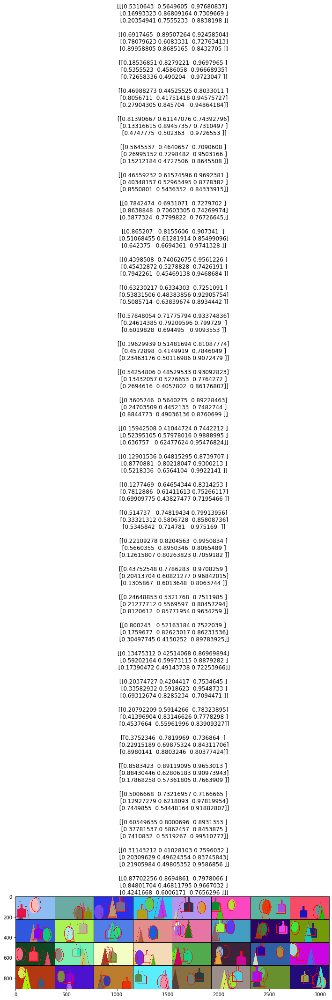

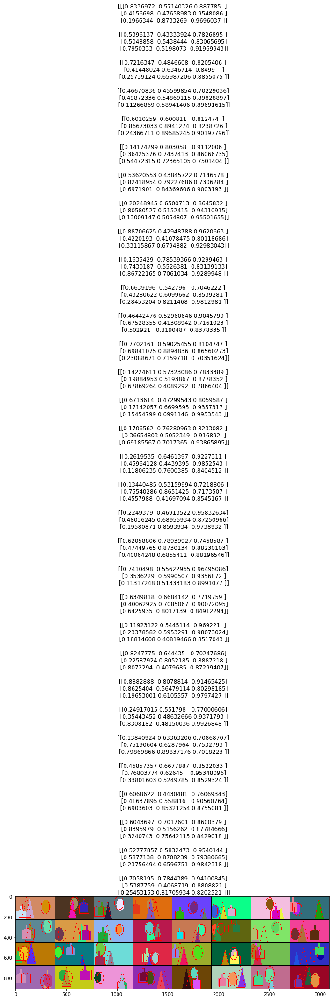

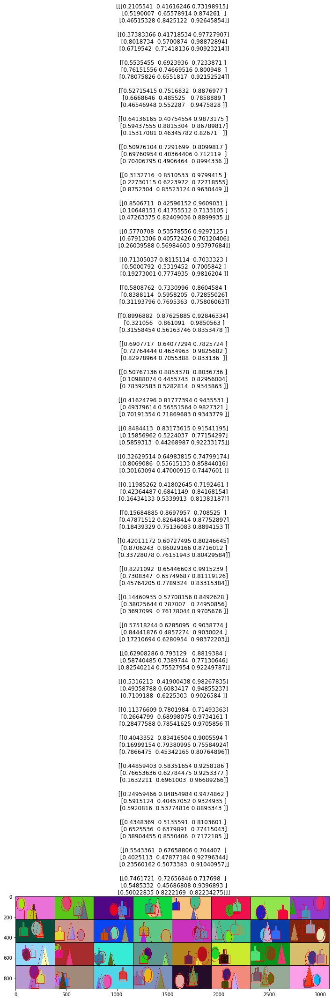

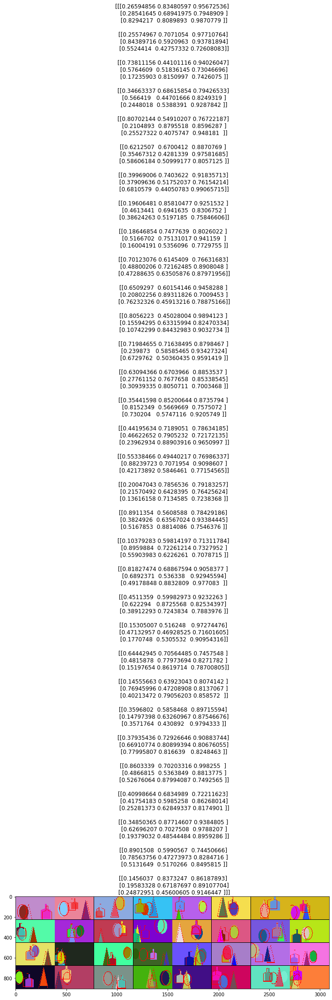

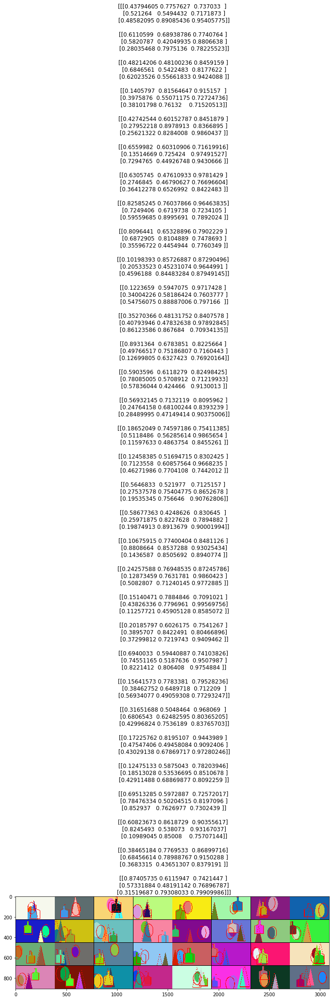

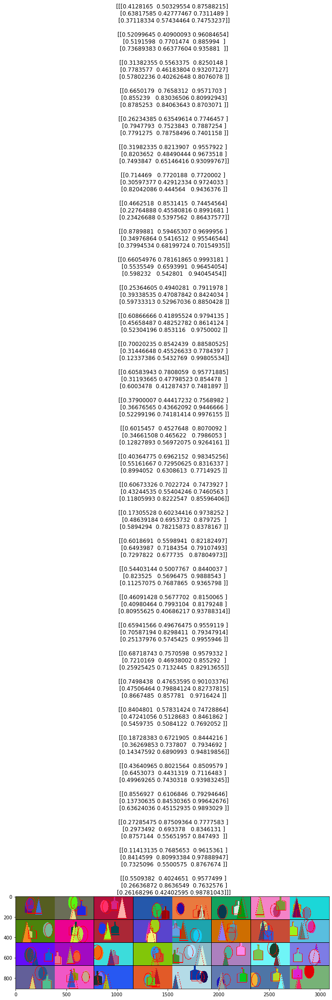

In [14]:
visualize_model(model_ft)

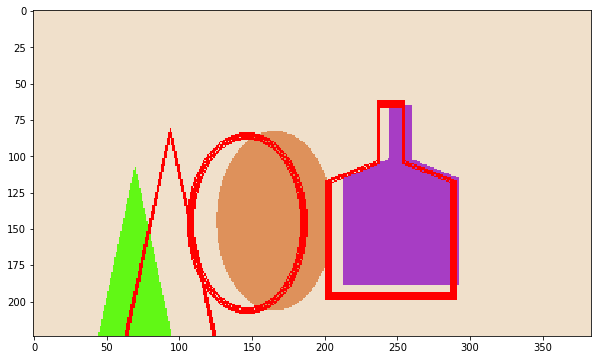

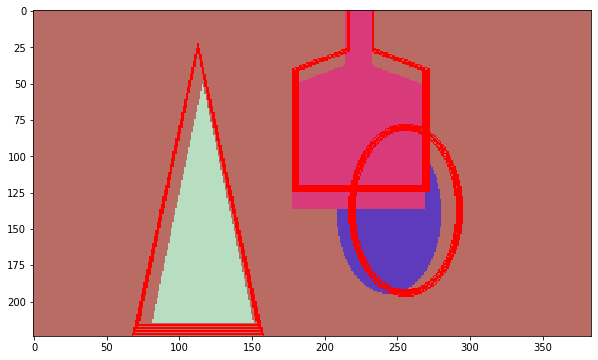

In [19]:
def show_batch(sample_batched, preds=None, ds=None):
    """Show image with landmarks for a batch of samples."""
    images_batch, coords_batch = \
            sample_batched[0], sample_batched[1]
    batch_size = len(images_batch)
    im_size = images_batch.size(2)
    grid_border_size = 2

    images_batch = [x.numpy().transpose((1, 2, 0)) for x in images_batch]
    if preds is not None:
        preds = [x.numpy() for x in preds]
        for img, pred in zip(images_batch, preds):
            ds.draw_preds(img, pred)

    images_batch = [transforms.ToTensor()(x) for x in images_batch]
    
    #grid = utils.make_grid(images_batch)
    #plt.imshow(grid.numpy().transpose((1, 2, 0)))
    plt.imshow(images_batch[0].numpy().transpose((1, 2, 0)))

    #for i in range(batch_size):
    #    plt.title(str(coords_batch.numpy()))
        
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            outputs = outputs.view((-1, N_CLASSES, 3))
            outputs = outputs.cpu()
            def A(t): return t.cpu()

            fig = plt.figure(figsize=(10, 10))
            show_batch((A(inputs), A(labels)), preds=A(outputs), ds=image_datasets['val'])
            plt.show()
            
            if i >= 1: break

        model.train(mode=was_training)

visualize_model(model_ft, num_images=2)